# Author: Midrar Adham
## HW5: Harris "Corners"

In [1]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

# Harris "Corners"

**Show the image in color and grayscale**
---

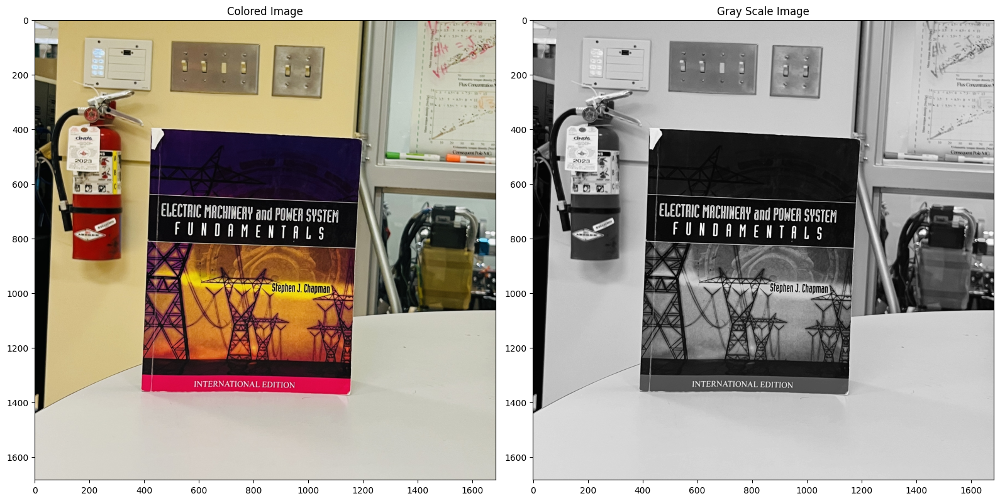

In [2]:
figure, ax = plt.subplots(1,2, figsize = (16,16))
img_color = cv.imread('../../sample_data/book.jpg')
img_color = cv.cvtColor(img_color, cv.COLOR_BGR2RGB)
img_gray = cv.cvtColor(img_color.copy(),cv.COLOR_RGB2GRAY)

ax[0].imshow(img_color)
ax[0].set_title('Colored Image')
ax[1].imshow(img_gray, cmap='gray')
ax[1].set_title('Gray Scale Image')
plt.tight_layout()

**Show the gradient components of the partial derivative in the horizontal and vertical directions.**
---

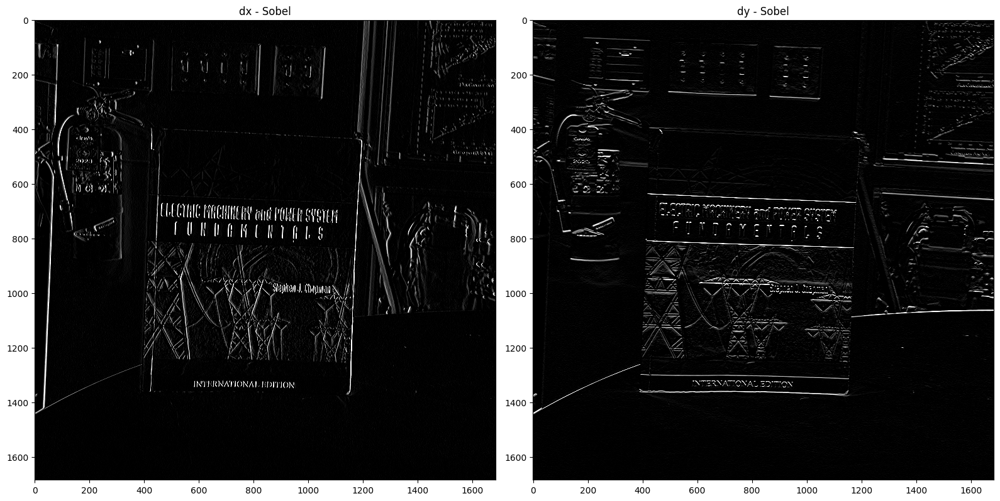

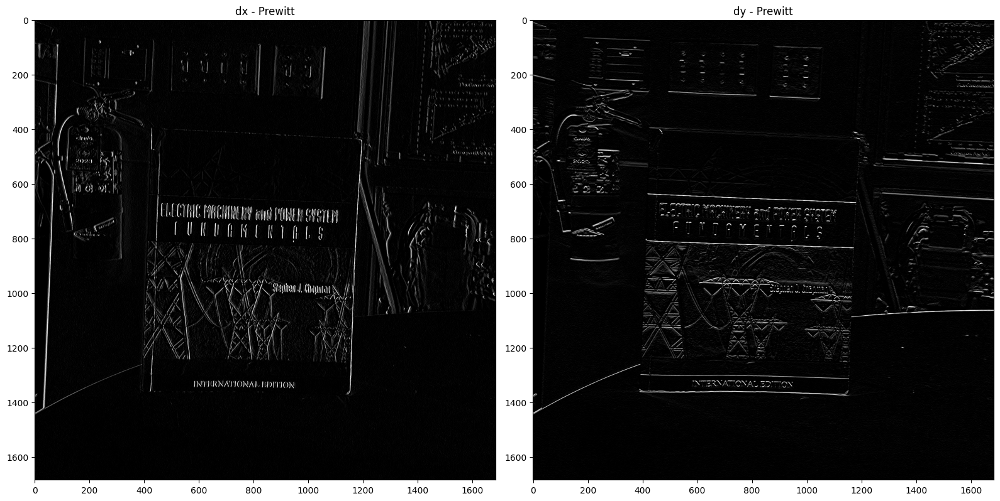

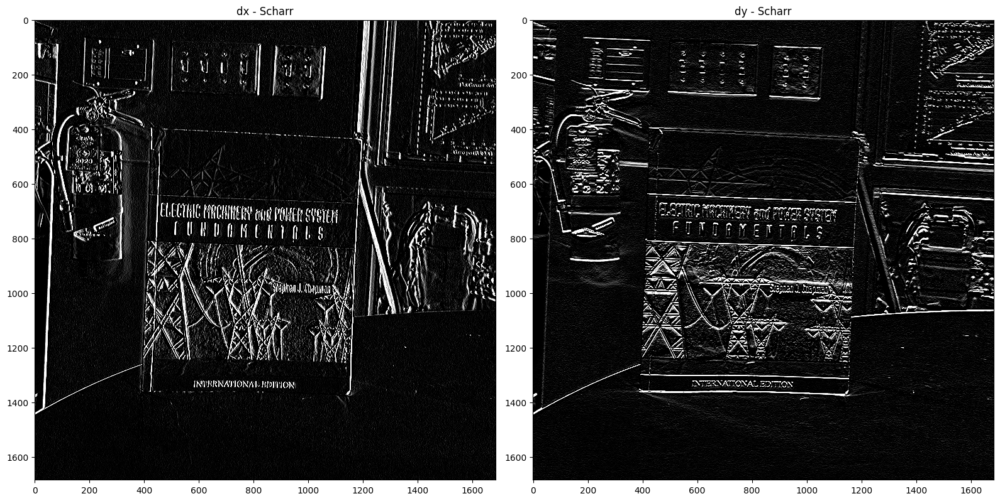

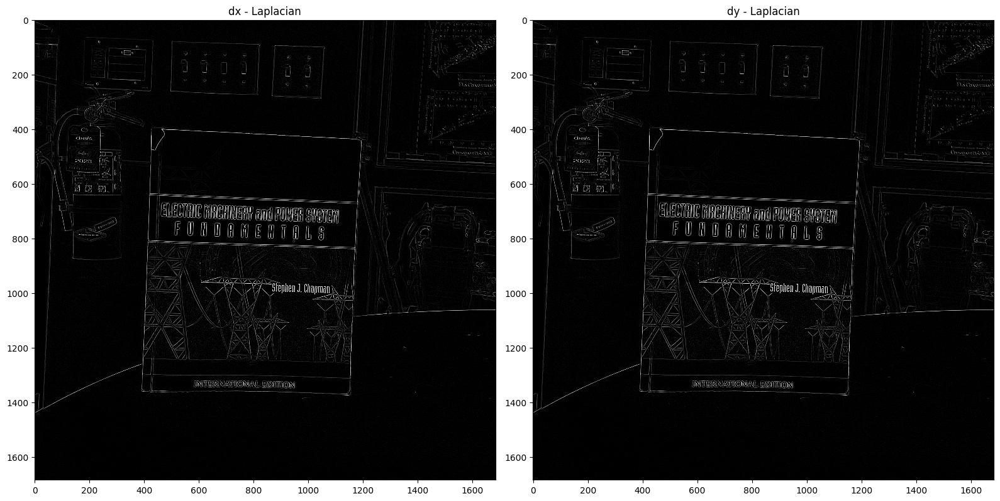

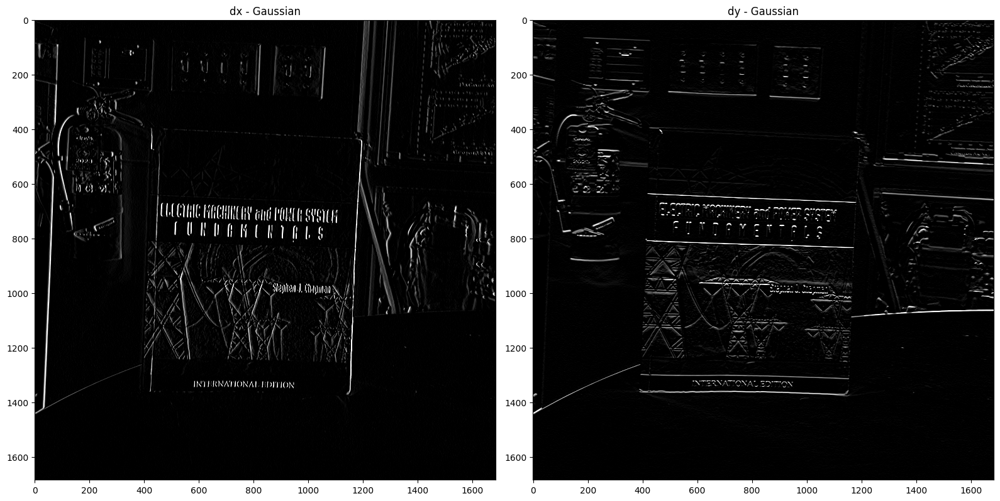

In [3]:
def get_gradient_comp (img, title):

    if title == 'Gaussian':
        img_gaussian = cv.GaussianBlur(img, (5, 5), 0)
        dx = cv.Sobel(img_gaussian, cv.CV_64F, 1, 0, ksize=3)
        dy = cv.Sobel(img_gaussian, cv.CV_64F, 0, 1, ksize=3)
        
    elif title == 'Prewitt':
        kernel_x = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])
        kernel_y = np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]])

        dx = cv.filter2D(img, -1, kernel_x)
        dy = cv.filter2D(img, -1, kernel_y)
    
    elif title == 'Sobel':
        
        dx = cv.Sobel(img, cv.CV_64F, 1,0, ksize=3, borderType=cv.BORDER_DEFAULT)
        dy = cv.Sobel(img, cv.CV_64F, 0,1, ksize=3, borderType=cv.BORDER_DEFAULT)
    
    elif title == 'Scharr':
        dx = cv.Scharr(img, cv.CV_64F, 1, 0)
        dy = cv.Scharr(img, cv.CV_64F, 0, 1)
    
    elif title == 'Laplacian':
        dx = cv.Laplacian(img, cv.CV_64F, ksize=3)
        dy = cv.Laplacian(img, cv.CV_64F, ksize=3)
    
    else:
        print('Invalid Title\t', title)
    
    return dx, dy

def plot_images (dx, dy, title):
    figure, ax = plt.subplots(1, 2, figsize=(16, 16))

    ax[0].imshow(dx, cmap='gray', vmin=0, vmax=255)
    ax[0].set_title(f'dx - {title}')

    ax[1].imshow(dy, cmap='gray', vmin=0, vmax=255)
    ax[1].set_title(f'dy - {title}')

    plt.tight_layout()

titles = ['Sobel', 'Prewitt', 'Scharr', 'Laplacian', 'Gaussian']

for t in titles:
    dx, dy = get_gradient_comp(img = img_gray, title=t)
    plot_images(dx, dy, t)
    plt.show()

**Explain and justify how you calculated the derivative. As we discussed in class, there are many ways to estimate the derivative of an image**
---

To evaluate the gradient performance of the image, I tried multiple methods to get the gradient. I chose the laplacian filter, even though the differences between these filters are minimal (except for the scharr). Among all of these filters, I think the scharr was not the best. The scharr did detect the edges in the book and the surroundings, however, given how its kernel designed, the scharr filter put some emphasize on the surrounding each pixel. 

The sobel, prewitt, and the gaussian did pretty well in detecting the edges of several objects within the image. However, the laplacian was the only filter that detected the four edges of the book, which I think is expected because it takes the second derivative of the image. Further, the laplacian provided balance between each object and its edges. For example, the fire distinguisher and the poster are not clear in the image, however, their edges are clearly shown.

**Show images of the components of the matrix used for Harris corner detection. This includes the two diagonal elements and the off diagonal element**
---

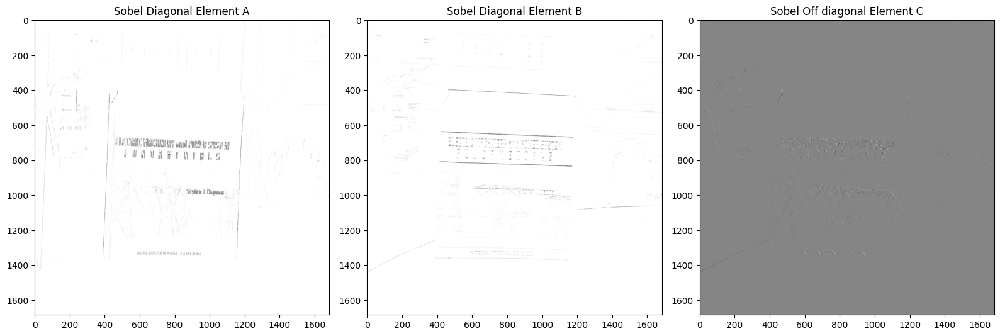

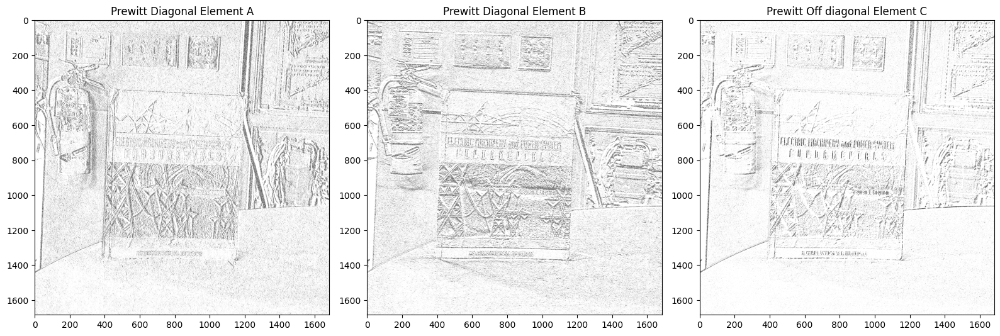

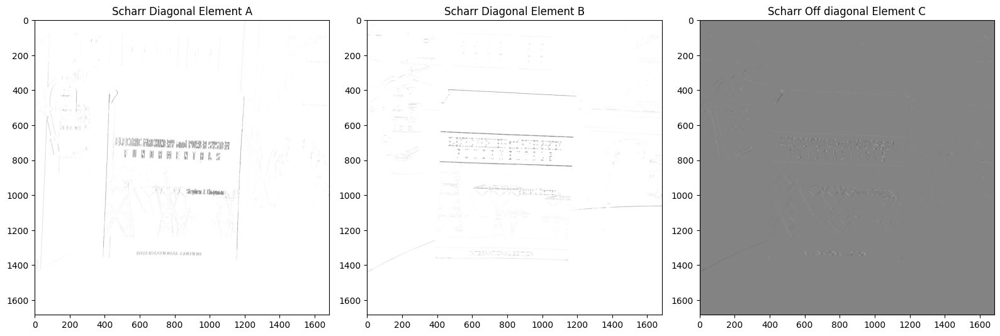

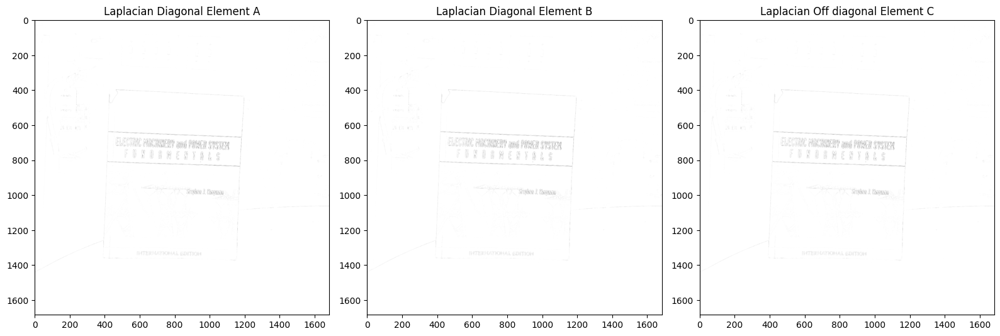

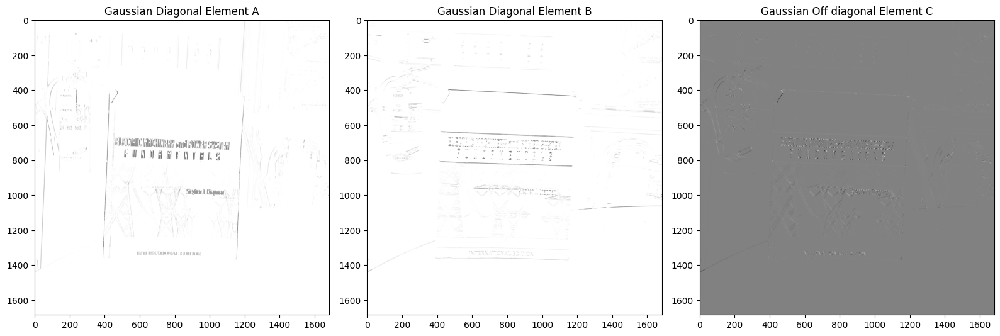

In [11]:
def harris_components (x_components, y_components):

    # Calculate the matrix components
    A = x_components ** 2
    B = y_components ** 2
    C = x_components * y_components
    return A, B, C

def plot_images (A, B, C, title):
    figure, ax = plt.subplots(1, 3, figsize=(16, 16))
    
    ax[0].imshow(A, cmap='gray_r')
    ax[0].set_title(f'{title} Diagonal Element A')

    ax[1].imshow(B, cmap='gray_r')
    ax[1].set_title(f'{title} Diagonal Element B')

    ax[2].imshow(C, cmap='gray_r')
    ax[2].set_title(f'{title} Off diagonal Element C')

    plt.tight_layout()

# x_comp = [dx_sobel, dx_prewitt, dx_scharr, dx_laplacian]
# y_comp = [dy_sobel, dy_prewitt, dy_scharr, dy_laplacian]
titles = ['Sobel', 'Prewitt', 'Scharr', 'Laplacian', 'Gaussian']
# titles = ['Sobel']
for t in titles:
    dx, dy = get_gradient_comp(img = img_gray, title=t)
    A, B, C = harris_components(dx, dy)
    plot_images(A, B, C, t)
    

The laplacian elements are the same because it calculates the second derivatives of the image.

**Calculate the figure of merit used by Harris. Plot this as an image**
---

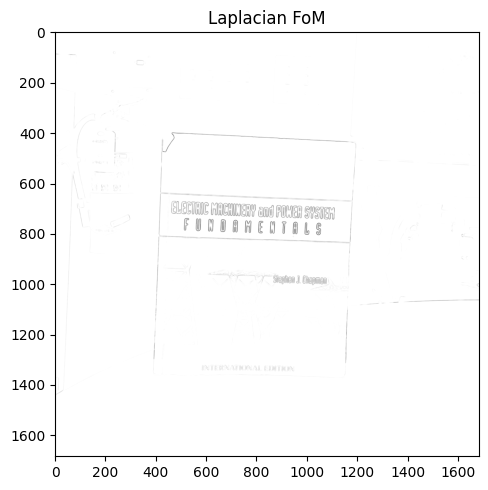

In [16]:
titles = ['Laplacian']
def fom (A, B, C):
    trace = A+B
    det = A*B - C**2
    k = 0.009 # Empirical constant.
    harris = det - k * np.square(trace)
    return harris
    
def plot_images (img, title):
    figure, ax = plt.subplots(1, 1, figsize=(5,5))
    ax.imshow(img, cmap='gray')
    ax.set_title(f'{title} FoM')

    plt.tight_layout()
    
for t in titles:
    harris = fom(A, B, C)
    plot_images(harris, 'Laplacian')
    

From the above, it seems like my choice was the worest. The FoM of the sobel, gaussian, and the scharr did way better than the gaussian FoM. This result is weird for me. I thought the gaussian blurr mixed with a filter might actually be the best option, but that does not seem to be the case.

**Select a threshold for the figure of merit. Show the points that are above the threshold on the grayscale version of the original image**
---

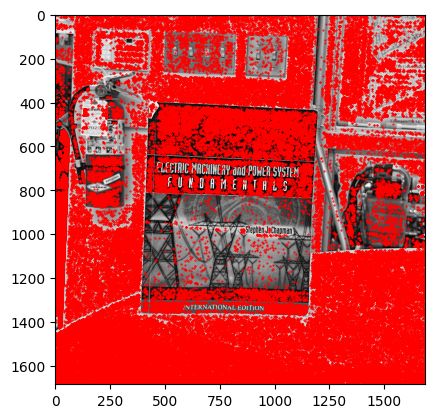

In [17]:
def harris_pts(img):
    threshold = np.percentile(img,93)
    pt1, pt2 = np.where(img > threshold)
    return pt1, pt2

pt1, pt2 = harris_pts(img=harris)
plt.imshow(img_gray, cmap='gray')
plt.scatter(pt2, pt1, s=1, c='red', marker='.')

**Try a variation of the Harris corner detector with a different figure of merit. Select a threshold that selects the same number of features as the original Harris detector. Show the points that are above the threshold on the grayscale version of the original image. How does this variation compare?**
---

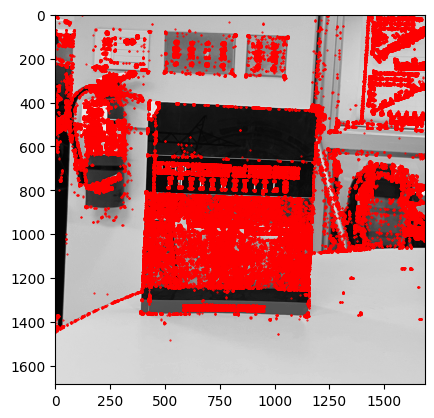

In [18]:
#Try minimum eigenvalue detector 
def ev(img):
    # get the minimum eigenvalues for the detector
    eigenvalues = cv.cornerMinEigenVal(img, blockSize=3, ksize=3)
    threshold = np.percentile(eigenvalues, 93)
    pts = np.where(eigenvalues > threshold)
    return eigenvalues, pts

# In the original detector, I chose 93. So I will choose the same here
eigenvalues, pts = ev(img=img_gray)
plt.imshow(img_gray, cmap='gray')
plt.scatter(pts[1], pts[0], s=1, c='red', marker='.')

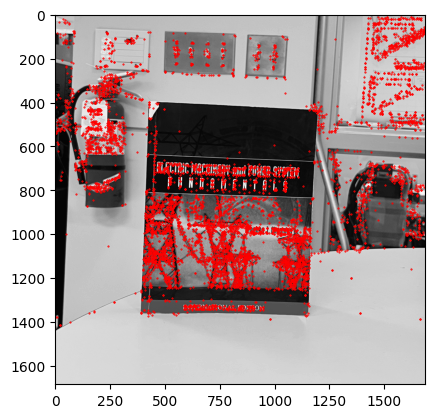

In [19]:
# Try SIFT:
def sift(img):
    sift = cv.SIFT_create()
    sift_pts = np.array([kp.pt for kp in sift.detect(img, None)])
    return sift_pts
sift_pts = sift(img=img_gray)
plt.imshow(img_gray, cmap='gray')
plt.scatter(sift_pts[:,0], sift_pts[:,1], s=1, c='red', marker='.')

**Explain and justify the variation that you chose**
---

- I think the harris corner detector did a good job in detecting the pixel intensity variations in the image. However, it seems to me that the harris corner works differently than the SIFT and the minimum eigenvalue methods. From the images above, the harris corner detector had a red point on all the spaces that has low pixel intensity (flat regions with less color variations). The minimum eigenvalue detecotor, on the other hand, filled the spaces where the pixel intensity changes. For example, the words in the book are filled with red circles. But, the flat regions do not have any red circles in them. Finally, the SIFT, which I think was the best, had circles only on the edges, where color variations happened the most. Of course there are some false positives, but I think it still performed very well.

I think the harris corner detector did very well in the lower part of the image. The pixel intensity variations were detected and red circles were drawn on the edges between the lines and the background

**Show detected "corners" in a series of at least 4 images of very different scenes to see how this algorithm works in a variety of images**
---

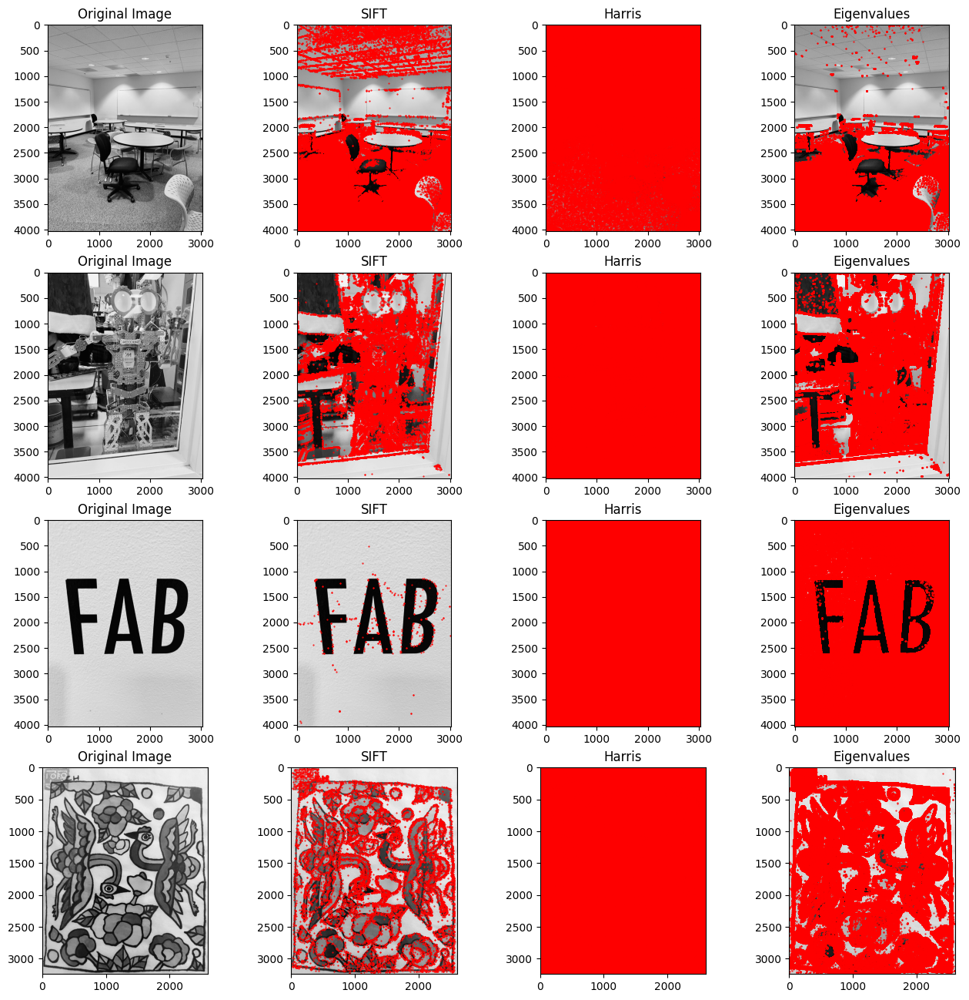

In [20]:
path = '../../sample_data/'
images = ['ckt.jpg','robot.jpg','fab.jpg','frame.jpg']

figure, ax = plt.subplots(4,4, figsize=(16,16))
for i in range(len(images)):
    img = cv.imread(path+images[i], cv.IMREAD_GRAYSCALE)
    # Get sift
    sift_pts = sift(img=img)
    
    # Get harris
    dx, dy = get_gradient_comp(img=img, title='Laplacian')
    A, B, C = harris_components(dx, dy)
    # Get FoM
    harris = fom(A, B, C)
    threshold = np.percentile(harris,94)
    pt1, pt2 = np.where(harris > threshold)
    # mean = np.mean(harris)
    # std = np.std(harris)
    # threshold = mean + (std/2)
    # print(threshold)
    # print(harris)
    # harris_normalized = cv.normalize(harris, None, alpha=0, beta=255, norm_type=cv.NORM_MINMAX, dtype=cv.CV_32F)
    # harris_8bit = np.uint8(harris_normalized)
    # _, threshold = cv.threshold(harris_8bit, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)
    # pt1, pt2 = np.where(harris > threshold)
    
    # Get eigenvalues
    eigenvalues, pts = ev(img=img)
    
    ax[i,0].imshow(img, cmap='gray')
    ax[i,0].set_title('Original Image')
    
    ax[i,1].imshow(img, cmap='gray')
    ax[i,1].set_title('SIFT')
    ax[i,1].scatter(sift_pts[:,0], sift_pts[:,1], s=1, c='red', marker='.')
    
    ax[i,2].imshow(img, cmap='gray')
    ax[i,2].set_title('Harris')
    ax[i,2].scatter(pt2, pt1, s=1, c='red', marker='.')
    
    ax[i,3].imshow(img, cmap='gray')
    ax[i,3].set_title('Eigenvalues')
    ax[i,3].scatter(pts[1], pts[0], s=1, c='red', marker='.')
    

It does not seem like harris is able to detect the edges. I tried to change the harris constant "k" and change the threshold with no luck. The maximum percentage is 6%. If I increase the percentage more than that, the original image is returned, which means all the values within the harris components (A, B, and C) are less than the threshold. 

On the other hand, the SIFT and eigenvalue methods did a good job of detecting the edges. I think the robot image, in particular, was not easy with unclear edges. 

# Reflections

**What, if anything, did you learn from this assignment?**
---
I'm still processing the harris corner. I think it is easy to manipulate the SIFT and see how that changes its performance on images. But it seems like the harris detector needs a clear edge so it can detect it.

**What questions do you have for me?**
---
Thank you!